# Models of Neurons Part 2

In [1]:
using Plots, Statistics
gr()

Plots.GRBackend()

In [2]:
function ref_LIFneuron(t,dt,I,V0)
  # Numerical simulation of a LIF neuron  
   
        t0=-20 # ms
        N = Int(t/dt)+1
        V = V0.*ones(N)
        
        for i=2:N
            if i*dt<t0+refrac_period
            V[i] = Vreset
            else
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm + dt*I[i]/Cm
            if V[i] > Vth
                V[i] = Vreset
                t0 = i*dt
            end
        end
        end
       
    return V
end

ref_LIFneuron (generic function with 1 method)

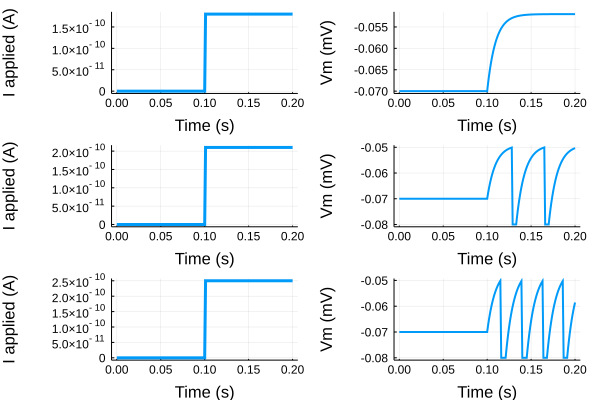

In [3]:
global Cm=100e-12  #F
global gl = 10e-9  #S
global El = -70e-3  #V
Vth = -50.0e-3 #mV
Vreset = -80.0e-3 #mV
V0=-70.0e-3 # V
# with these conditions taum = 10ms and Ith = 200 pA
refrac_period=5e-3 # in seconds
dt=1.0e-3
t=200.0e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)
I = 0.0*ones(Int(t/dt)+1)
t_min =100.0e-3 
t_off=300.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=0.18e-9.*ones(length(I[idx]))



fig = plot(layout=(3,2),legend=false)
xlabel!("Time (s)")
ylabel!("Vm (mV)")

# low current
V = ref_LIFneuron(t,dt,I,V0)
plot!(fig[1], 0:dt:t,I,linewidth=3)
plot!(fig[2],0:dt:t,V,linewidth=2,label="I = 0.18 nA")
ylabel!(fig[1],"I applied (A)")

# medium current
I[idx]=0.21e-9.*ones(length(I[idx]))
V = ref_LIFneuron(t,dt,I,V0)
plot!(fig[4],0:dt:t,V,linewidth=2,label="I = 0.21 nA")
plot!(fig[3], 0:dt:t,I,linewidth=3)
ylabel!(fig[3],"I applied (A)")


# High current
I[idx]=0.25e-9.*ones(length(I[idx]))
V = ref_LIFneuron(t,dt,I,V0)
plot!(fig[6],0:dt:t,V,linewidth=2,label="I = 0.25 nA")
plot!(fig[5], 0:dt:t,I,linewidth=3)
ylabel!(fig[5],"I applied (A)")

fig

### Refractory conductance

In [6]:
delta_G = 500e-9           # Increase in potassium conductance 
EK = -0.080               #potassium reversal potential (for refractory conductance)
tauref=0.002

function ref_conductance__LIFneuron(t,dt,I,V0)
  # Numerical simulation of a LIF neuron  
   
        t0=-20 # ms
        N = Int(t/dt)+1
        V = V0.*ones(N)
        gref=0.0
    
        for i=2:N
            gref = gref - dt*gref/tauref
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm +dt*(-gref*(V[i-1] - EK))/Cm + dt*I[i]/Cm
            if V[i] > Vth
                V[i] = Vreset
                gref = gref+delta_G
            end
        end
     
       
    return V
end

ref_conductance__LIFneuron (generic function with 1 method)

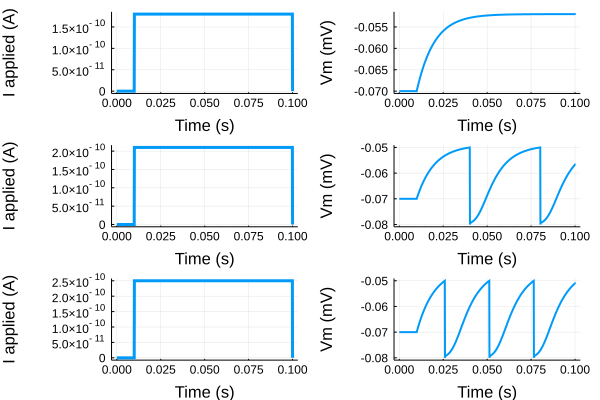

In [15]:
t_min =10.0e-3 
dt=1.0e-4
t=100.0e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)
I = zeros(length(t_plot))
t_off=100.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=0.18e-9.*ones(length(I[idx]))



fig = plot(layout=(3,2),legend=false)
xlabel!("Time (s)")
ylabel!("Vm (mV)")

# low current
V = ref_conductance__LIFneuron(t,dt,I,V0)
plot!(fig[1], 0:dt:t,I,linewidth=3)
plot!(fig[2],0:dt:t,V,linewidth=2,label="I = 0.18 nA")
ylabel!(fig[1],"I applied (A)")

# medium current
I[idx]=0.21e-9.*ones(length(I[idx]))
V = ref_conductance__LIFneuron(t,dt,I,V0)
plot!(fig[4],0:dt:t,V,linewidth=2,label="I = 0.21 nA")
plot!(fig[3], 0:dt:t,I,linewidth=3)
ylabel!(fig[3],"I applied (A)")


# High current
I[idx]=0.25e-9.*ones(length(I[idx]))
V = ref_conductance__LIFneuron(t,dt,I,V0)
plot!(fig[6],0:dt:t,V,linewidth=2,label="I = 0.25 nA")
plot!(fig[5], 0:dt:t,I,linewidth=3)
ylabel!(fig[5],"I applied (A)")

fig

## Raised threshold

In [18]:
deltaV = 0.2


function raised_th__LIFneuron(t,dt,I,V0)
  # Numerical simulation of a LIF neuron  
   
        t0=-20 # ms
        N = Int(t/dt)+1
        V = V0.*ones(N)
        gref=0.0
        Vthl = Vth

        for i=2:N
            Vthl = Vth + (Vthl-Vth)*exp(-dt/tauref);
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm + dt*I[i]/Cm
            if V[i] > Vth
                V[i] = Vreset
                Vthl = Vthl + deltaV
            end
        end
     
       
    return V
end

raised_th__LIFneuron (generic function with 1 method)

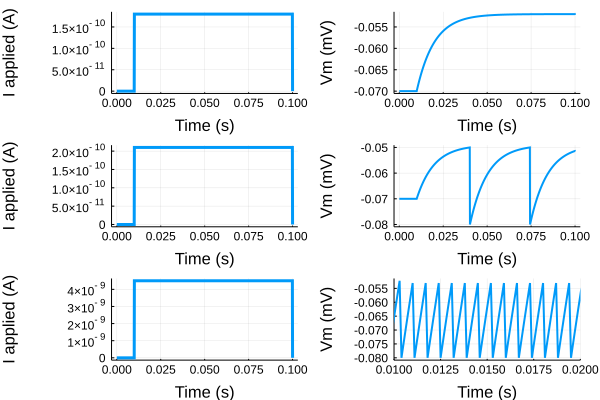

In [29]:
t_min =10.0e-3 
dt=1.0e-4
t=100.0e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)
I = zeros(length(t_plot))
t_off=100.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=0.18e-9.*ones(length(I[idx]))



fig = plot(layout=(3,2),legend=false)
xlabel!("Time (s)")
ylabel!("Vm (mV)")

# low current
V = raised_th__LIFneuron(t,dt,I,V0)
plot!(fig[1], 0:dt:t,I,linewidth=3)
plot!(fig[2],0:dt:t,V,linewidth=2,label="I = 0.18 nA")
ylabel!(fig[1],"I applied (A)")

# medium current
I[idx]=0.21e-9.*ones(length(I[idx]))
V = raised_th__LIFneuron(t,dt,I,V0)
plot!(fig[4],0:dt:t,V,linewidth=2,label="I = 0.21 nA")
plot!(fig[3], 0:dt:t,I,linewidth=3)
ylabel!(fig[3],"I applied (A)")


# High current
I[idx]=4.5e-9.*ones(length(I[idx]))
V = raised_th__LIFneuron(t,dt,I,V0)
plot!(fig[6],0:dt:t,V,linewidth=2,label="I = 0.25 nA")
plot!(fig[5], 0:dt:t,I,linewidth=3)
xaxis!(fig[6],(0.01,0.02))
ylabel!(fig[5],"I applied (A)")

fig

## Non Linear Models

In [35]:
Vreset=0.1
Vth=1.0
function quadratic_neuron(t,dt,V0,b)
  # Numerical simulation of a LIF neuron  
   
        N = Int(t/dt)+1
        V = V0.*ones(N)
 

        for i=2:N
            V[i] = V[i-1] + dt*(b +V[i-1]*V[i-1])
            if V[i] > Vth
                V[i] = Vreset
            end
        end
     
       
    return V
end

quadratic_neuron (generic function with 1 method)

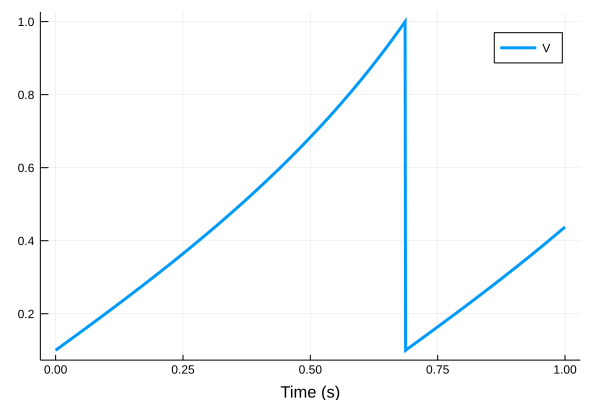

In [42]:
b=1.0
V0=0.1
dt=1.0e-3
t=1000.0e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)

V=quadratic_neuron(t,dt,V0,b)

plot(t_plot,V,label="V",linewidth=3)
xlabel!("Time (s)")

In [58]:
function quadratic_theoric(t,dt,b,V0)
    trace=V0.*ones(Int(t/dt)+1)
    
    t0 = 1/sqrt(b) * atan(V0/sqrt(b))
    
    for i=2:Int(t/dt)+1
      trace[i] = sqrt(b)*tan(sqrt(b)*(dt*i+t0))  
    end
    
  return trace  
end

quadratic_theoric (generic function with 1 method)

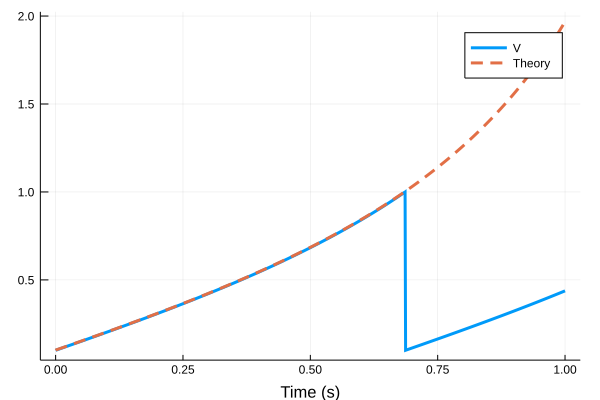

In [61]:
Vt = quadratic_theoric(t,dt,b,V0)


V=quadratic_neuron(t,dt,V0,b)

plot(t_plot,V,label="V",linewidth=3)
plot!(t_plot,Vt,label="Theory",linewidth=3,linestyle=:dash)
xlabel!("Time (s)")

Now we consider $b<0$.



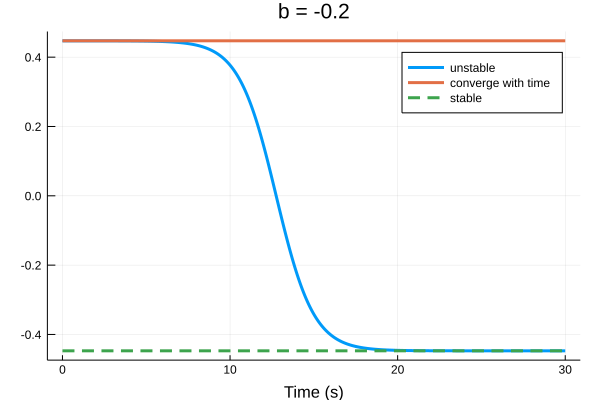

In [87]:
b=-0.2
t=30000e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)

V0=sqrt(abs(b))-0.00001
V=quadratic_neuron(t,dt,V0,b)
plot(t_plot,V,linewidth=3,label="unstable")

V0=sqrt(abs(b))
V=quadratic_neuron(t,dt,V0,b)
plot!(t_plot,V,linewidth=3,label="converge with time")


V0=-sqrt(abs(b))
V=quadratic_neuron(t,dt,V0,b)
plot!(t_plot,V,linewidth=3,linestyle=:dash,label="stable")

xlabel!("Time (s)")
title!("b = $b")

We want now to see the oscillations when $v_{reset} > \sqrt{b}$:

### Bistability

We highlight how to obtain bistability with the quadratic integrate and fire model.

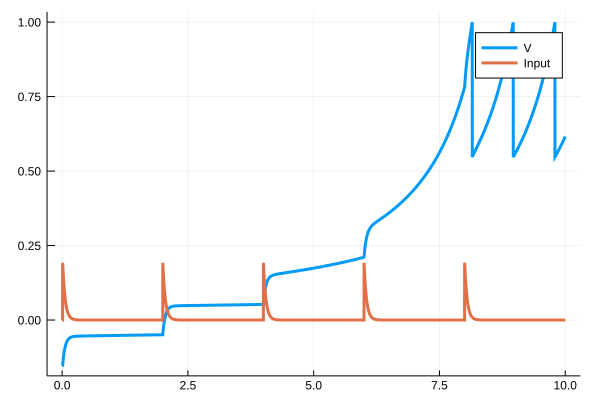

In [119]:
Vreset=sqrt(abs(b))+0.1
V0=sqrt(abs(b))-0.6


dt=1.0e-3
t=10000.0e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)
I = zeros(length(t_plot))
t_min =10.0e-3 
t_off=2000.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=2.0.*ones(length(I[idx])).*exp.(-(t_plot[idx].-t_plot[Int(t_min/dt)]).*20)

t_min =2000.0e-3 
t_off=4000.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=2.0.*ones(length(I[idx])).*exp.(-(t_plot[idx].-t_plot[Int(t_min/dt)]).*20)


t_min =4000.0e-3 
t_off=6000.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=2.0.*ones(length(I[idx])).*exp.(-(t_plot[idx].-t_plot[Int(t_min/dt)]).*20)


t_min =6000.0e-3 
t_off=8000.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=2.0.*ones(length(I[idx])).*exp.(-(t_plot[idx].-t_plot[Int(t_min/dt)]).*20)


t_min =8000.0e-3 
t_off=10000.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=2.0.*ones(length(I[idx])).*exp.(-(t_plot[idx].-t_plot[Int(t_min/dt)]).*20)

function quadratic_neuron_current(t,dt,V0,b)
  # Numerical simulation of a LIF neuron  
   
        N = Int(t/dt)+1
        V = V0.*ones(N)
 

        for i=2:N
            V[i] = V[i-1] + dt*(b[i] +V[i-1]*V[i-1])
            if V[i] > Vth
                V[i] = Vreset
            end
        end
     
       
    return V
end
V=quadratic_neuron_current(t,dt,V0,I)
plot(t_plot,V,linewidth=3,label="V")
plot!(t_plot,I./10,linewidth=3,label="Input")



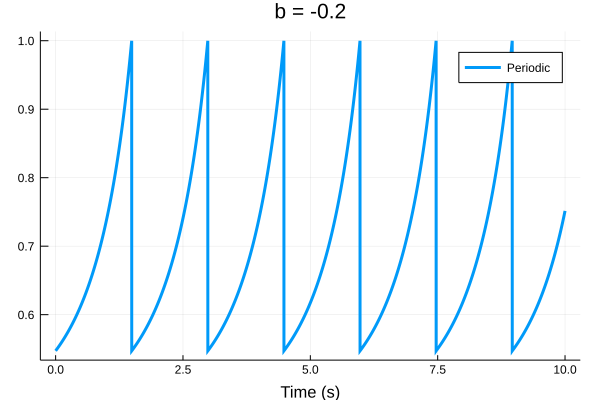

In [86]:
b=-0.2
t=10000e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)

V0=sqrt(abs(b))+0.1
Vreset=sqrt(abs(b))+0.1
V=quadratic_neuron(t,dt,V0,b)
plot(t_plot,V,linewidth=3,label="Periodic")

xlabel!("Time (s)")
title!("b = $b")